In [5]:
import numpy as np

from regain.data import load_food_search_trends

In [24]:
data = load_food_search_trends()

In [25]:
data

,anise,apple,apple-cider,apple-pie,apricot,asparagus,avocado,baked-beans,baked-chicken,banana-bread,...,tequila-sunrise,tom-collins,turkey,turmeric,turnip,watermelon,whiskey-sour,white-russian,white-wine,wild-leek
2004-01,26.0,17.0,2.0,3.0,35.0,12.0,16.0,7.0,23.0,30.0,...,29.0,66.0,1.0,11.0,24.0,4.0,20.0,21.0,25.0,0.0
2004-02,25.0,19.0,6.0,3.0,42.0,10.0,11.0,6.0,39.0,31.0,...,21.0,29.0,1.0,17.0,20.0,3.0,7.0,29.0,24.0,0.0
2004-03,12.0,19.0,4.0,3.0,17.0,8.0,13.0,7.0,20.0,24.0,...,22.0,55.0,1.0,9.0,19.0,3.0,14.0,26.0,30.0,0.0
2004-04,14.0,17.0,5.0,5.0,34.0,7.0,14.0,10.0,41.0,27.0,...,14.0,34.0,1.0,13.0,17.0,4.0,17.0,15.0,26.0,0.0
2004-05,21.0,15.0,2.0,3.0,28.0,8.0,14.0,7.0,27.0,22.0,...,21.0,23.0,1.0,13.0,9.0,3.0,26.0,17.0,13.0,20.0
2004-06,20.0,14.0,3.0,3.0,37.0,14.0,13.0,3.0,23.0,26.0,...,14.0,23.0,1.0,10.0,20.0,5.0,21.0,18.0,26.0,20.0
2004-07,19.0,17.0,1.0,4.0,27.0,16.0,11.0,9.0,46.0,23.0,...,8.0,17.0,1.0,7.0,18.0,3.0,10.0,17.0,27.0,25.0
2004-08,20.0,19.0,3.0,3.0,27.0,15.0,14.0,6.0,36.0,31.0,...,16.0,21.0,1.0,7.0,15.0,7.0,13.0,20.0,17.0,28.0
2004-09,19.0,15.0,5.0,3.0,35.0,13.0,13.0,9.0,29.0,24.0,...,14.0,19.0,1.0,9.0,11.0,5.0,26.0,23.0,23.0,33.0
2004-10,22.0,20.0,3.0,3.0,20.0,18.0,14.0,9.0,26.0,28.0,...,21.0,27.0,1.0,11.0,21.0,9.0,16.0,31.0,18.0,29.0


In [92]:
X = data.values
y = np.zeros(X.shape[0])
for i in range(X.shape[0]):
    y[i] = i%52
X = np.log(X) # to make counts gaussian-like
X[np.isinf(X)] = 0

/home/vero/miniconda2/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning:

divide by zero encountered in log



In [112]:
from importlib import reload
import regain.covariance.kernel_time_graphical_lasso_; reload(regain.covariance.kernel_time_graphical_lasso_)
from regain.covariance.kernel_time_graphical_lasso_ import SimilarityTimeGraphicalLasso, precision_similarity

from sklearn.utils.extmath import squared_norm

In [94]:
mdl = SimilarityTimeGraphicalLasso(alpha=1, psi='l2'
).fit(X,y)

/home/vero/git_repos/regain/regain/covariance/kernel_time_graphical_lasso_.py:230: UserWarning:

Objective did not converge.



In [95]:
from regain.norm import l1_norm

In [113]:
mdl.similarity_matrix = precision_similarity(mdl.get_observed_precision(), squared_norm)

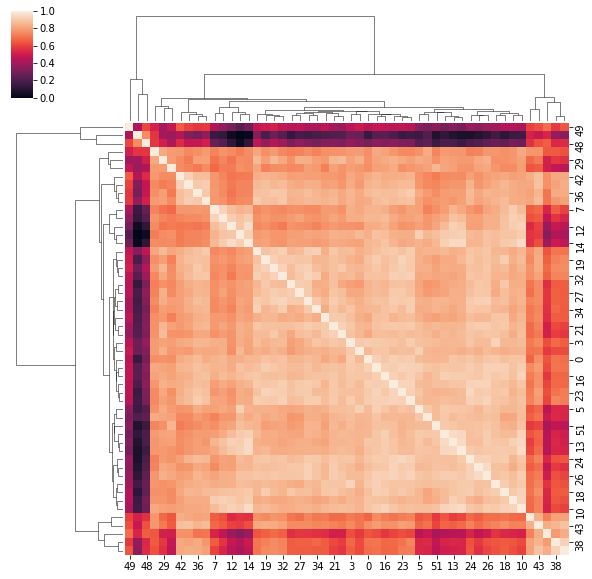

In [114]:
import seaborn as sns
sns.clustermap(mdl.similarity_matrix)

In [121]:
from sklearn.cluster import AgglomerativeClustering
clustering = AgglomerativeClustering(affinity='precomputed', linkage='complete', n_clusters=3)
clustering.fit(1-mdl.similarity_matrix)
clustering.labels_

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 2, 2, 0, 1, 1])

In [98]:
import plotly.offline as py; py.init_notebook_mode();
from regain.plotting.plotly import plot_circular
import networkx as nx
%matplotlib inline

In [99]:
A = np.abs(mdl.precision_[14])
np.fill_diagonal(A, 0)

In [102]:
G = nx.from_numpy_array(A/np.max(A))
fig = plot_circular(G, labels=list(data.columns.values), dist_text=1.5)

In [104]:
py.iplot(fig)

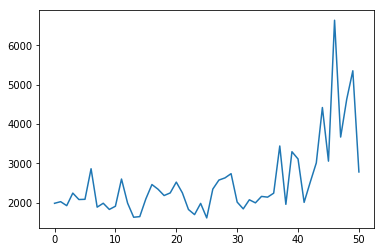

In [107]:
plt.plot([np.linalg.norm(mdl.precision_[i]-mdl.precision_[i+1]) for i in range(mdl.precision_.shape[0]-1)])